In [1]:
#import Libraries
import pandas as pd
import numpy as np
from glob import glob
import nltk
from nltk.tokenize import word_tokenize
import plotly.express as px
from numpy.linalg import norm
from scipy.spatial.distance import pdist
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA
from wordcloud import WordCloud
import matplotlib.colors as mcolors
from gensim.models import word2vec
from sklearn.manifold import TSNE
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from scipy.linalg import eigh as eig
import seaborn as sns


In [2]:
#load wine reviews file
df_file=pd.read_csv('winemag-data-130k-v2.csv')

In [3]:
df_file.head(5)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks


In [4]:
#deleive the column with unnamed header
df = df_file.loc[:, ~df_file.columns.str.contains('^Unnamed')]

In [5]:
#create a dictionary for country.
DIC_C={}
#assign each country a numerical value
counter=1
for i in df['country'].unique():
    DIC_C[i]=counter
    counter=counter+1

In [6]:
DIC_C

{'Italy': 1,
 'Portugal': 2,
 'US': 3,
 'Spain': 4,
 'France': 5,
 'Germany': 6,
 'Argentina': 7,
 'Chile': 8,
 'Australia': 9,
 'Austria': 10,
 'South Africa': 11,
 'New Zealand': 12,
 'Israel': 13,
 'Hungary': 14,
 'Greece': 15,
 'Romania': 16,
 'Mexico': 17,
 'Canada': 18,
 nan: 19,
 'Turkey': 20,
 'Czech Republic': 21,
 'Slovenia': 22,
 'Luxembourg': 23,
 'Croatia': 24,
 'Georgia': 25,
 'Uruguay': 26,
 'England': 27,
 'Lebanon': 28,
 'Serbia': 29,
 'Brazil': 30,
 'Moldova': 31,
 'Morocco': 32,
 'Peru': 33,
 'India': 34,
 'Bulgaria': 35,
 'Cyprus': 36,
 'Armenia': 37,
 'Switzerland': 38,
 'Bosnia and Herzegovina': 39,
 'Ukraine': 40,
 'Slovakia': 41,
 'Macedonia': 42,
 'China': 43,
 'Egypt': 44}

In [7]:
#add a country id column to the dataframe using the dictionary created
df['country_id'] = df['country'].map(DIC_C)


In [8]:
#create a dictionary for wine variety.
DIC_V={}

#assign each variety a numerical value
counter=1
for i in df['variety'].unique():
    DIC_V[i]=counter
    counter=counter+1

In [9]:
#add a variety id to the dataframe using the dictionary created
df['variety_id'] = df['variety'].map(DIC_V)


In [10]:
#create a dictionary for wine region.

DIC_R={}
#assign each region a numerical value
counter=1
for i in df['region_1'].unique():
    DIC_R[i]=counter
    counter=counter+1
#add a region id to the dataframe using the dictionary created
df['region_id'] = df['region_1'].map(DIC_R)


In [11]:
df.head()

,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery,country_id,variety_id,region_id
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia,1,1,1
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos,2,2,2
2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,3,3,3
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,3,4,4
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,3,5,3


In [12]:
#create a dataframe from the dictionary
DIC_C_DF=pd.DataFrame.from_dict(DIC_C,orient='index')\
                .rename(columns={0:'country_id'})\
                .rename_axis("country")


In [13]:
#create a dataframe from the dictionary
DIC_V_DF=pd.DataFrame.from_dict(DIC_V,orient='index')\
                .rename(columns={0:'variety_id'})\
                .rename_axis("variety")


In [14]:
#create a dataframe from the dictionary
DIC_R_DF=pd.DataFrame.from_dict(DIC_R,orient='index')\
                .rename(columns={0:'region_id'})\
                .rename_axis("region")


In [15]:
OHCO=['country_id','variety_id','region_id','points','price','token_num']


In [16]:
COUNTRY = OHCO[:1]
VARIETY = OHCO[:2]
REGION = OHCO[:3]
POINTS = OHCO[:4]
PRICE = OHCO[:5]

In [17]:
#set index in dataframe using OHCO
df = df.set_index(OHCO[:5])

In [18]:
df.head()

country  \
country_id variety_id region_id points price              
1          1          1         87     NaN        Italy   
2          2          2         87     15.0    Portugal   
3          3          3         87     14.0          US   
           4          4         87     13.0          US   
           5          3         87     65.0          US   

                                                                                     description  \
country_id variety_id region_id points price                                                       
1          1          1         87     NaN     Aromas include tropical fruit, broom, brimston...   
2          2          2         87     15.0    This is ripe and fruity, a wine that is smooth...   
3          3          3         87     14.0    Tart and snappy, the flavors of lime flesh and...   
           4          4         87     13.0    Pineapple rind, lemon pith and orange blossom ...   
           5          3         87     65.0    Much like the regular bottling from 2012, this...   

                                                                      designation  \
country_id variety_id region_id points price                                        
1          1          1         87     NaN                           Vulkà Bianco   
2          2          2         87     15.0                              Avidagos   
3          3          3         87     14.0                                   NaN   
           4          4         87     13.0                  Reserve Late Harvest   
           5          3         87     65.0    Vintner's Reserve Wild Child Block   

                                                        province  \
country_id variety_id region_id points price                       
1          1          1         87     NaN     Sicily & Sardinia   
2          2          2         87     15.0                Douro   
3          3          3         87     14.0               Oregon   
           4          4         87     13.0             Michigan   
           5          3         87     65.0               Oregon   

                                                          region_1  \
country_id variety_id region_id points price                         
1          1          1         87     NaN                    Etna   
2          2          2         87     15.0                    NaN   
3          3          3         87     14.0      Willamette Valley   
           4          4         87     13.0    Lake Michigan Shore   
           5          3         87     65.0      Willamette Valley   

                                                        region_2  \
country_id variety_id region_id points price                       
1          1          1         87     NaN                   NaN   
2          2          2         87     15.0                  NaN   
3          3          3         87     14.0    Willamette Valley   
           4          4         87     13.0                  NaN   
           5          3         87     65.0    Willamette Valley   

                                                      taster_name  \
country_id variety_id region_id points price                        
1          1          1         87     NaN          Kerin O’Keefe   
2          2          2         87     15.0            Roger Voss   
3          3          3         87     14.0          Paul Gregutt   
           4          4         87     13.0    Alexander Peartree   
           5          3         87     65.0          Paul Gregutt   

                                              taster_twitter_handle  \
country_id variety_id region_id points price                          
1          1          1         87     NaN             @kerinokeefe   
2          2          2         87     15.0              @vossroger   
3          3          3         87     14.0             @paulgwine    
           4          4         87     13.0          

In [19]:
#use nltk to tokenize data - set up tokenizer
tokenizer = nltk.RegexpTokenizer(r"(\w+)")


In [20]:
#create token data frame from description colummn. also adds POS
df_token = df.description\
        .apply(lambda x: pd.Series(nltk.pos_tag(tokenizer.tokenize(x))))\
        .stack()\
        .to_frame()\
        .rename(columns={0:'pos_tuple'})

In [21]:
#create seperate columns for POS and token string
df_token['pos'] = df_token.pos_tuple.apply(lambda x: x[1])
df_token['token_str'] = df_token.pos_tuple.apply(lambda x: x[0])


In [22]:
df_token.head(30)

pos_tuple  pos  \
country_id variety_id region_id points price                              
1          1          1         87     NaN    0      (Aromas, NNP)  NNP   
                                              1     (include, VBP)  VBP   
                                              2     (tropical, JJ)   JJ   
                                              3        (fruit, NN)   NN   
                                              4        (broom, NN)   NN   
                                              5    (brimstone, NN)   NN   
                                              6          (and, CC)   CC   
                                              7       (dried, VBD)  VBD   
                                              8         (herb, NN)   NN   
                                              9          (The, DT)   DT   
                                              10      (palate, NN)   NN   
                                              11         (isn, NN)   NN   
                                              12          (t, VBD)  VBD   
                                              13      (overly, RB)   RB   
                                              14  (expressive, JJ)   JJ   
                                              15    (offering, NN)   NN   
                                              16   (unripened, JJ)   JJ   
                                              17       (apple, NN)   NN   
                                              18      (citrus, NN)   NN   
                                              19         (and, CC)   CC   
                                              20       (dried, JJ)   JJ   
                                              21        (sage, NN)   NN   
                                              22   (alongside, RB)   RB   
                                              23       (brisk, JJ)   JJ   
                                              24     (acidity, NN)   NN   
2          2          2         87     15.0   0         (This, DT)   DT   
                                              1          (is, VBZ)  VBZ   
                                              2         (ripe, JJ)   JJ   
                                              3          (and, CC)   CC   
                                              4       (fruity, NN)   NN   

                                                   token_str  
country_id variety_id region_id points price                  
1          1          1         87     NaN    0       Aromas  
                                              1      include  
                                              2     tropical  
                                              3        fruit  
                                              4        broom  
                                              5    brimstone  
                                              6          and  
                                              7        dried  
                                              8         herb  
                                              9          The  
                                              10      palate  
                                              11         isn  
                                              12           t  
                                              13      overly  
                                              14  expressive  
                                              15    offering  
                                              16   unripened  
                                              17       apple  
                                              18      citrus  
                                              19         and  
                                              20       dried  
                                              21        sage  
                                              22   alongside  
                                              23       brisk  
                  

In [23]:
#set index names
df_token.index.names = OHCO

In [24]:
df_token.head()

pos_tuple  pos  \
country_id variety_id region_id points price token_num                        
1          1          1         87     NaN   0           (Aromas, NNP)  NNP   
                                             1          (include, VBP)  VBP   
                                             2          (tropical, JJ)   JJ   
                                             3             (fruit, NN)   NN   
                                             4             (broom, NN)   NN   

                                                       token_str  
country_id variety_id region_id points price token_num            
1          1          1         87     NaN   0            Aromas  
                                             1           include  
                                             2          tropical  
                                             3             fruit  
                                             4             broom

In [25]:
#token table
TOKEN=df_token

In [26]:
#create term string column
TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '')

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_25720/4195587284.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '')


In [27]:
TOKEN=TOKEN.sort_index()

In [28]:
#create a vocab table. count the terms, rename columns, and set index
VOCAB = TOKEN.term_str.value_counts().to_frame().rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'

In [29]:
VOCAB['num'] = VOCAB.term_str.str.match("\d+").astype('int')

In [30]:
VOCAB.sample(20)

,term_str,n,num
term_id,,,
16288,lucia,70,0
3751,boudamani,2,0
25384,slope,124,0
19731,paced,4,0
15851,lifts,264,0
20007,paso,304,0
10750,fillip,17,0
17343,mere,79,0
15368,lamonica,2,0


In [31]:
#add stop words
sw1 = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
#custom stop words
lst= ['wine', 'drink', 'fruit', 'finish', 'notes', 'flavors', 'palate', 'note', 'blend']
sw2=pd.DataFrame((lst),columns=['term_str'])
#merge nltk with custom stop words
sw=pd.concat([sw1,sw2])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1

In [32]:
#stop words dataframe
sw.sample(10)

,dummy
term_str,
of,1
about,1
shouldn't,1
didn't,1
don't,1
a,1
wasn't,1
isn't,1
below,1


In [33]:
#add stop words column to identify stop words in vocab dataframe
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')

In [34]:
#check. 1 is stop word. 0 is not stop word
VOCAB[VOCAB.stop == 1].sample(10)

,term_str,n,num,stop
term_id,,,,
8728,don,892,0,1
30971,wouldn,25,0,1
27898,them,521,0,1
13111,hasn,58,0,1
30583,weren,19,0,1
14534,its,17982,0,1
18836,not,8180,0,1
31145,yourself,18,0,1
14500,isn,638,0,1


In [35]:
#drop stop words from the vocab dataframe
VOCAB=VOCAB[VOCAB.stop != 1]

In [36]:
VOCAB[VOCAB.stop == 1]

,term_str,n,num,stop
term_id,,,,


In [37]:
#add stems
from nltk.stem.porter import PorterStemmer

stemmer = PorterStemmer()
VOCAB['p_stem'] = VOCAB.term_str.apply(stemmer.stem)

In [38]:
VOCAB.sample(10)

,term_str,n,num,stop,p_stem
term_id,,,,,
10226,extra,1203,0,0,extra
29411,unsalted,1,0,0,unsalt
18114,mouthtingling,1,0,0,mouthtingl
10771,finch,2,0,0,finch
25696,soothes,13,0,0,sooth
26751,subtance,1,0,0,subtanc
30253,voluptuousness,23,0,0,voluptu
20205,peep,4,0,0,peep
9807,erase,1,0,0,eras


## TFIDF

In [39]:
#create function that returns a TFIDF matrix

def TFIDF(TOKEN,bag,count_method,tf_method,idf_method):

    #BOW and create a document-term count matrix

    BOW = TOKEN.groupby(bag+['term_id']).term_id.count()\
    .to_frame().rename(columns={'term_id':'n'})
    BOW['c'] = BOW.n.astype('bool').astype('int')
    DTCM = BOW[count_method].unstack().fillna(0).astype('int')

    #formula for TF based on method

    if tf_method == 'sum':
        TF = DTCM.T / DTCM.T.sum()

    elif tf_method == 'max':
        TF = DTCM.T / DTCM.T.max()

    elif tf_method == 'log':
        TF = np.log10(1 + DTCM.T)
    
    elif tf_method == 'raw':
        TF = DTCM.T

    elif tf_method == 'double_norm':
        TF = DTCM.T / DTCM.T.max()
        TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0]

    elif tf_method == 'binary':
        TF = DTCM.T.astype('bool').astype('int')
    TF = TF.T
    
    #compute DF based on document-term count matrix
    DF = DTCM[DTCM > 0].count()

    #compute IDF  
    N = DTCM.shape[0]
    
    if idf_method == 'standard':
        IDF = np.log10(N / DF)

    elif idf_method == 'max':
        IDF = np.log10(DF.max() / DF) 

    elif idf_method == 'smooth':
        IDF = np.log10((1 + N) / (1 + DF)) + 1

    #multiply TF and IDF to get TFIDF matrix    
    TFIDF_matrix=TF*IDF
    return TFIDF_matrix



In [40]:
#remove N/As from VOCAB and TOKEN
VOCAB = VOCAB[~VOCAB.term_str.isna()]
TOKEN = TOKEN[~TOKEN.term_str.isna()]

In [41]:
#add term id to Token dataframe from VOCAB dataframe
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)

In [42]:
TOKEN.head(10)

pos_tuple  pos  \
country_id variety_id region_id points price token_num                         
1          1          1         83     32.0  0               (Part, NN)   NN   
                                             1                 (of, IN)   IN   
                                             2                (the, DT)   DT   
                                             3             (orange, NN)   NN   
                                             4               (wine, NN)   NN   
                                             5           (movement, NN)   NN   
                                             6               (this, DT)   DT   
                                             7          (literally, RB)   RB   
                                             8              (does, VBZ)  VBZ   
                                             9               (open, VB)   VB   

                                                        token_str   term_str  \
country_id variety_id region_id points price token_num                         
1          1          1         83     32.0  0               Part       part   
                                             1                 of         of   
                                             2                the        the   
                                             3             orange     orange   
                                             4               wine       wine   
                                             5           movement   movement   
                                             6               this       this   
                                             7          literally  literally   
                                             8               does       does   
                                             9               open       open   

                                                        term_id  
country_id variety_id region_id points price token_num           
1          1          1         83     32.0  0          19973.0  
                                             1              NaN  
                                             2              NaN  
                                             3          19313.0  
                                             4              NaN  
                                             5          18125.0  
                                             6              NaN  
                                             7          16024.0  
                                             8              NaN  
                                             9          19257.0

In [43]:
#set up column in VOCAB that shows the max POS for the term
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)

In [44]:
VOCAB.head(10)

,term_str,n,num,stop,p_stem,pos_max
term_id,,,,,,
0,0,17,1,0,0,CD
1,000,283,1,0,000,CD
2,008,1,1,0,008,CD
3,01,8,1,0,01,CD
4,02,6,1,0,02,CD
5,03,16,1,0,03,CD
6,030,1,1,0,030,CD
7,035,1,1,0,035,CD
8,04,61,1,0,04,CD


In [45]:
# run the function using variety as the bag and n count method for BOW
q1=TFIDF(TOKEN,VARIETY,'n','sum','standard')

In [46]:
#add the TFIDF sum to the VOCAB matrix
VOCAB['tfidf_sum'] = q1.sum()

In [47]:
#sort to get the top 40 words in the corpus by TFIDF sum
VOCAB.sort_values('tfidf_sum', ascending=False).head(40)

,term_str,n,num,stop,p_stem,pos_max,tfidf_sum
term_id,,,,,,,
5571,cherry,29322,0,0,cherri,NN,6.828307
3299,black,29024,0,0,black,JJ,6.499725
27487,tannins,30878,0,0,tannin,NNS,5.520513
30667,white,12916,0,0,white,JJ,5.230045
22515,red,21784,0,0,red,JJ,5.147000
15705,lemon,9596,0,0,lemon,JJ,4.945836
20141,peach,8728,0,0,peach,NN,4.805598
1795,apple,13581,0,0,appl,NN,4.791892
1992,aromas,39639,0,0,aroma,NN,4.700557


In [48]:
#add term rank column to Vocab
if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1

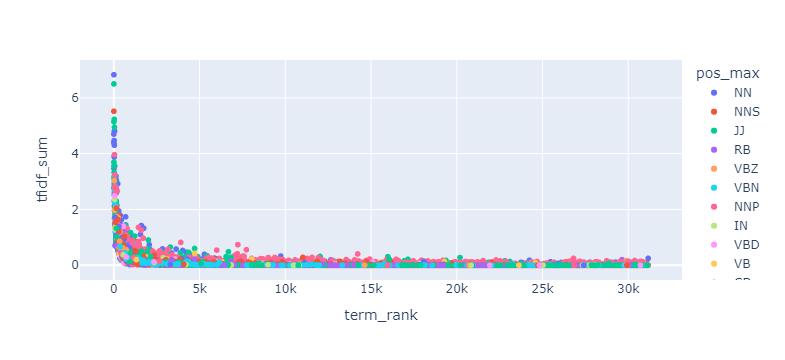

In [49]:
#scatter plot of term rank and tfidf in vocab
px.scatter(VOCAB, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max', 
           log_x=False, log_y=False)

In [50]:
#ditribution of wines by points
df_file.groupby('points').count()['title']


points
80       397
81       692
82      1836
83      3025
84      6480
85      9530
86     12600
87     16933
88     17207
89     12226
90     15410
91     11359
92      9613
93      6489
94      3758
95      1535
96       523
97       229
98        77
99        33
100       19
Name: title, dtype: int64

<AxesSubplot:>

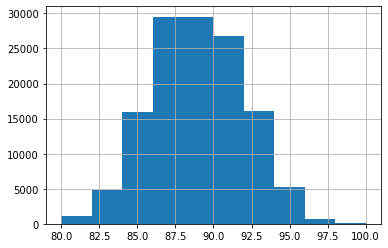

In [51]:
#histogram to visualize distribution of wines by their points
df_file['points'].hist()

In [52]:
df_file["points"].describe()

count    129971.000000
mean         88.447138
std           3.039730
min          80.000000
25%          86.000000
50%          88.000000
75%          91.000000
max         100.000000
Name: points, dtype: float64

In [53]:
#create token dataframe of just high rated wines - points higher than 91
TOKEN_HR=TOKEN.loc[(TOKEN.index.get_level_values('points') > 91)]

In [54]:
#create vocab dataframe of just high rated wines - points higher than 91

VOCAB_HR = TOKEN_HR.term_str.value_counts().to_frame().rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB_HR.index.name = 'term_id'

In [55]:
VOCAB_HR['num'] = VOCAB_HR.term_str.str.match("\d+").astype('int')
VOCAB_HR['stop'] = VOCAB_HR.term_str.map(sw.dummy)
VOCAB_HR['stop'] = VOCAB_HR['stop'].fillna(0).astype('int')
VOCAB_HR=VOCAB_HR[VOCAB_HR.stop != 1]

In [56]:
#add stems
stemmer = PorterStemmer()
VOCAB_HR['p_stem'] = VOCAB_HR.term_str.apply(stemmer.stem)

In [57]:
VOCAB_HR.sample(10)

,term_str,n,num,stop,p_stem
term_id,,,,,
14952,strengths,10,0,0,strength
5458,enlivened,16,0,0,enliven
12946,reversed,1,0,0,revers
4897,dominus,2,0,0,dominu
5488,enters,8,0,0,enter
3048,charbay,1,0,0,charbay
1720,believes,7,0,0,believ
4541,demonstrate,5,0,0,demonstr
15885,tincture,1,0,0,tinctur


In [58]:
#remove N/As from VOCAB and TOKEN
VOCAB_HR = VOCAB_HR[~VOCAB_HR.term_str.isna()]
TOKEN_HR = TOKEN_HR[~TOKEN_HR.term_str.isna()]

In [59]:
#add term id to Token high rated dataframe from VOCAB dataframe
TOKEN_HR['term_id'] = TOKEN_HR.term_str.map(VOCAB_HR.reset_index().set_index('term_str').term_id)

In [60]:
#set up column in VOCAB that shows the max POS for the term
VOCAB_HR['pos_max'] = TOKEN_HR.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)

In [61]:
# run the tfidf function using variety as the bag and n count method for BOW
q2=TFIDF(TOKEN_HR,VARIETY,'n','sum','standard')

In [62]:
#add the TFIDF sum to the VOCAB matrix
VOCAB_HR['tfidf_sum'] = q2.sum()

In [63]:
#sort to get the top 40 words in the high rated wines by TFIDF sum
VOCAB_HR.sort_values('tfidf_sum', ascending=False).head(40)

,term_str,n,num,stop,p_stem,pos_max,tfidf_sum
term_id,,,,,,,
1904,black,7707,0,0,black,JJ,2.072002
3118,cherry,5654,0,0,cherri,NN,1.724973
15499,tannins,6900,0,0,tannin,NNS,1.707082
1907,blackberry,2971,0,0,blackberri,NN,1.626338
2572,cabernet,2510,0,0,cabernet,NNP,1.485840
1154,aromas,5376,0,0,aroma,NN,1.415565
523,acidity,6213,0,0,acid,NN,1.354721
17234,white,1964,0,0,white,JJ,1.323447
7722,honey,901,0,0,honey,NN,1.254318


In [64]:
#add term rank
if 'term_rank' not in VOCAB_HR.columns:
    VOCAB_HR = VOCAB_HR.sort_values('n', ascending=False).reset_index()
    VOCAB_HR.index.name = 'term_rank'
    VOCAB_HR = VOCAB_HR.reset_index()
    VOCAB_HR = VOCAB_HR.set_index('term_id')
    VOCAB_HR['term_rank'] = VOCAB_HR['term_rank'] + 1

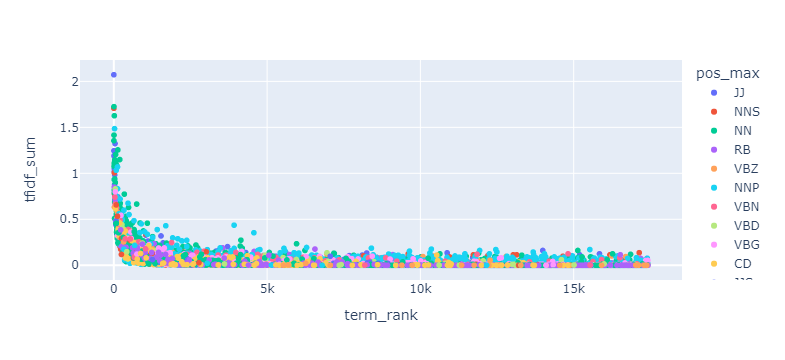

In [65]:
#scatter plot of vocab in high rated wines
px.scatter(VOCAB_HR, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max', 
           log_x=False, log_y=False)

In [66]:
#create token dataframe of low rated wines - wines below 86 points
TOKEN_LR=TOKEN.loc[(TOKEN.index.get_level_values('points') < 86)]

In [67]:
#create vocab dataframe of low rated wines - wines below 86 points
VOCAB_LR = TOKEN_LR.term_str.value_counts().to_frame().rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB_LR.index.name = 'term_id'
VOCAB_LR['num'] = VOCAB_LR.term_str.str.match("\d+").astype('int')
VOCAB_LR['stop'] = VOCAB_LR.term_str.map(sw.dummy)
VOCAB_LR['stop'] = VOCAB_LR['stop'].fillna(0).astype('int')
#remove stop words
VOCAB_LR=VOCAB_LR[VOCAB_LR.stop != 1]

In [68]:
#add stems
stemmer = PorterStemmer()
VOCAB_LR['p_stem'] = VOCAB_LR.term_str.apply(stemmer.stem)

In [69]:
#remove N/As from VOCAB and TOKEN
VOCAB_LR = VOCAB_LR[~VOCAB_LR.term_str.isna()]
TOKEN_LR = TOKEN_LR[~TOKEN_LR.term_str.isna()]
#add term id to Token dataframe from VOCAB dataframe
TOKEN_LR['term_id'] = TOKEN_LR.term_str.map(VOCAB_LR.reset_index().set_index('term_str').term_id)
#set up column in VOCAB that shows the max POS for the term
VOCAB_LR['pos_max'] = TOKEN_LR.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)

In [70]:
# run the tfidf function using variety as the bag and n count method for BOW
q3=TFIDF(TOKEN_LR,VARIETY,'n','sum','standard')

In [71]:
#add the TFIDF sum to the VOCAB matrix
VOCAB_LR['tfidf_sum'] = q3.sum()
#sort to get the top 40 words in the low rated wines by TFIDF sum
VOCAB_LR.sort_values('tfidf_sum', ascending=False).head(40)



,term_str,n,num,stop,p_stem,pos_max,tfidf_sum
term_id,,,,,,,
2118,cherry,3716,0,0,cherri,NN,3.802409
9003,red,3583,0,0,red,JJ,3.789385
714,aromas,6559,0,0,aroma,NN,3.439791
1163,berry,2868,0,0,berri,NN,3.177509
296,acidity,5042,0,0,acid,NN,3.056000
12457,white,1657,0,0,white,JJ,3.051654
11099,tannins,3008,0,0,tannin,NNS,3.019898
2236,citrus,2128,0,0,citru,NN,2.876274
642,apple,2172,0,0,appl,NN,2.858843


In [72]:
#add term rank
if 'term_rank' not in VOCAB_LR.columns:
    VOCAB_LR = VOCAB_LR.sort_values('n', ascending=False).reset_index()
    VOCAB_LR.index.name = 'term_rank'
    VOCAB_LR = VOCAB_LR.reset_index()
    VOCAB_LR = VOCAB_LR.set_index('term_id')
    VOCAB_LR['term_rank'] = VOCAB_LR['term_rank'] + 1

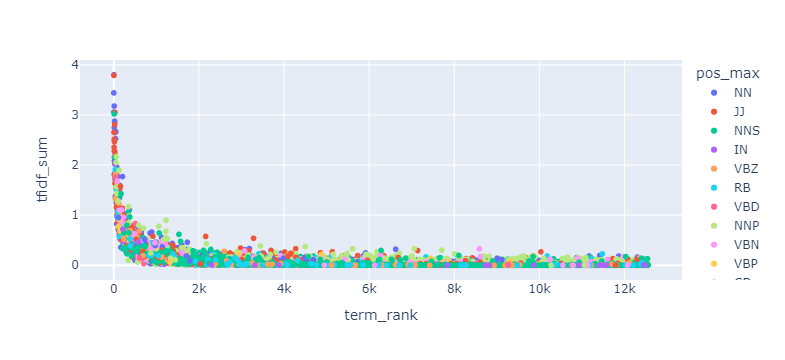

In [73]:
#scatter plot of tfidf and term rank
px.scatter(VOCAB_LR, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max', 
           log_x=False, log_y=False)

In [74]:
#build vocab dataframe with just adjectives - high rated wines
adjectives= ['JJ' ,'JJR',"JJS"] 
VOCAB_HR.loc[VOCAB_HR['pos_max'].isin(adjectives)].head(20)

,term_rank,term_str,n,num,stop,p_stem,pos_max,tfidf_sum
term_id,,,,,,,,
1904,1,black,7707,0,0,black,JJ,2.072002
13054,4,ripe,5986,0,0,ripe,JJ,1.245601
12993,7,rich,4974,0,0,rich,JJ,1.188223
4351,9,dark,3621,0,0,dark,JJ,1.191889
6646,10,full,3451,0,0,full,JJ,1.014851
12621,11,red,3401,0,0,red,JJ,1.055610
5046,19,dry,2558,0,0,dri,JJ,0.792325
6560,25,fresh,2459,0,0,fresh,JJ,0.876863
9158,28,long,2371,0,0,long,JJ,0.983287


In [75]:
#build vocab dataframe with just adjectives - low rated wines
VOCAB_LR.loc[VOCAB_LR['pos_max'].isin(adjectives)].head(20)

,term_rank,term_str,n,num,stop,p_stem,pos_max,tfidf_sum
term_id,,,,,,,,
9003,4,red,3583,0,0,red,JJ,3.789385
10979,5,sweet,3511,0,0,sweet,JJ,2.655784
10283,6,soft,3289,0,0,soft,JJ,2.650626
3566,7,dry,3094,0,0,dri,JJ,2.352801
6316,9,light,3006,0,0,light,JJ,2.516272
5077,12,green,2482,0,0,green,JJ,2.277887
4634,14,fresh,2414,0,0,fresh,JJ,2.467559
9311,15,ripe,2353,0,0,ripe,JJ,2.160009
10072,17,simple,2175,0,0,simpl,JJ,1.783055


In [76]:
variety=OHCO[:2]
DIC_V_DF=DIC_V_DF.reset_index()

In [77]:
#create a token variety table by adding wine varity name to the token table
TOKEN_variety=pd.merge(TOKEN,DIC_V_DF,on='variety_id')
TOKEN_variety=TOKEN_variety.set_index('variety_id')
#add term id to Token variety dataframe from VOCAB dataframe
TOKEN_variety['term_id'] = TOKEN_variety.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)
#drop where term_id is NaN (these are stop words)
TOKEN_variety=TOKEN_variety.dropna(subset=['term_id'])

In [78]:
#run TFIDF function to get matrix
TFIDF_variety=TFIDF(TOKEN_variety,["variety_id"],'n','sum','standard')

In [79]:
#Collapse TFIDF- group by variety id
TFIDF_variety = TFIDF_variety.groupby(["variety_id"]).mean()

In [80]:
#Create normalized tables
L0 = TFIDF_variety.astype('bool').astype('int')
L1 = TFIDF_variety.apply(lambda x: x / x.sum(), 1)
L2 = TFIDF_variety.apply(lambda x: x / norm(x), 1)

# Clustering and Similarity between different wine varieties

In [81]:
#Create DOC PAIR Table
PAIRS = pd.DataFrame(index=pd.MultiIndex.from_product([DIC_V_DF.index.tolist(), DIC_V_DF.index.tolist()])).reset_index()
PAIRS = PAIRS[PAIRS.level_0 < PAIRS.level_1].set_index(['level_0','level_1'])
PAIRS.index.names = ['doc_a', 'doc_b']

In [82]:
#Compute distances
#PAIRS['cityblock'] = pdist(TFIDF_variety, 'cityblock')
#PAIRS['euclidean'] = pdist(TFIDF_variety, 'euclidean')
PAIRS['cosine'] = pdist(TFIDF_variety, 'cosine')
PAIRS['jaccard'] = pdist(L0, 'jaccard')
#PAIRS['dice'] = pdist(L0, 'dice')
#PAIRS['js'] = pdist(L1, 'jensenshannon')
#PAIRS['euclidean2'] = pdist(L2, 'euclidean')
#PAIRS['correlation']=pdist(TFIDF_variety, 'correlation')

In [83]:
#Create Cluster Diagrams
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

In [84]:
def hca(sims, linkage_method='ward', color_thresh=.3, figsize=(15, 200)):
    tree = sch.linkage(sims, method=linkage_method)
    labels = DIC_V_DF.variety.values
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels, 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14)
    plt.tight_layout()
    plt.savefig("image.pdf")

<Figure size 432x288 with 0 Axes>

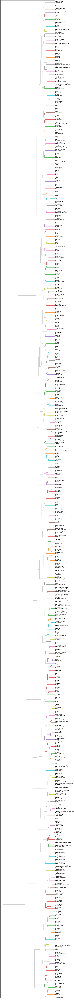

In [85]:
#cosine dendagram- similarity between varieties
hca(PAIRS.cosine, color_thresh=1)

# Topic Modeling

In [86]:
#convert token table to table of varieties 
PARAS = TOKEN_variety[TOKEN_variety.pos.str.match(r'^NNS?$')]\
    .groupby(['variety_id']).term_str\
    .apply(lambda x: ' '.join(x))\
    .to_frame()\
    .rename(columns={'term_str':'para_str'})

In [87]:
PARAS

,para_str
variety_id,
1,part orange movement bordering orange color pa...
2,rosé strawberries touch sugar structure light ...
3,reduction cohesion melon lead apple citrus pin...
4,flower peach cream passion close beeswax lyche...
5,winemaker muscle results jammy vineyards middl...
...,...
704,mouthfeel aromas prune plum spice velvety mout...
705,grape beckons fragrances flowers nuts apple ci...
706,list grape forms part range producer quantitie...


In [89]:
#parameters for topic model
n_terms = 1000
n_topics = 40
max_iter = 5

# use CountVectorizer to convert corpus of varieties into a document-term vector space of word counts.
tfv = CountVectorizer(max_features=n_terms, stop_words='english')
tf = tfv.fit_transform(PARAS.para_str)
TERMS = tfv.get_feature_names()

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [90]:
#generate model using LDA algorithm
lda = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)

In [91]:
#extract theta table - doc to topic matrix
THETA = pd.DataFrame(lda.fit_transform(tf), index=PARAS.index)
THETA.columns.name = 'topic_id'

#merge theta table with varieties dataframe to add variety name to the tabele
THETA=pd.merge(THETA,DIC_V_DF,on='variety_id').set_index('variety_id')


In [92]:
#extract phi table - term to topic matrix

PHI = pd.DataFrame(lda.components_, columns=TERMS)
PHI.index.name = 'topic_id'
PHI.columns.name  = 'term_str'

In [93]:
#Create topic table - top 10 terms per topic
TOPICS_table=PHI.stack().to_frame().rename(columns={0:'weight'})\
        .groupby('topic_id')\
        .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)
                   .reset_index()
              .drop('topic_id',1)
              .drop('weight',1)
              )

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_25720/2715845756.py:5: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



In [94]:
#merge topics table with VOCAB table
TOPICS_table=TOPICS_table.reset_index().merge(VOCAB.reset_index(),how="left",on="term_str").set_index("topic_id").drop("level_1",1)

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_25720/3729817526.py:2: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



In [95]:
#Table with Topics Top 10 terms per topic
TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)

C:\Users\Lenovo\AppData\Local\Temp/ipykernel_25720/1345003180.py:5: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



C:\Users\Lenovo\AppData\Local\Temp/ipykernel_25720/833310874.py:5: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



<AxesSubplot:ylabel='label'>

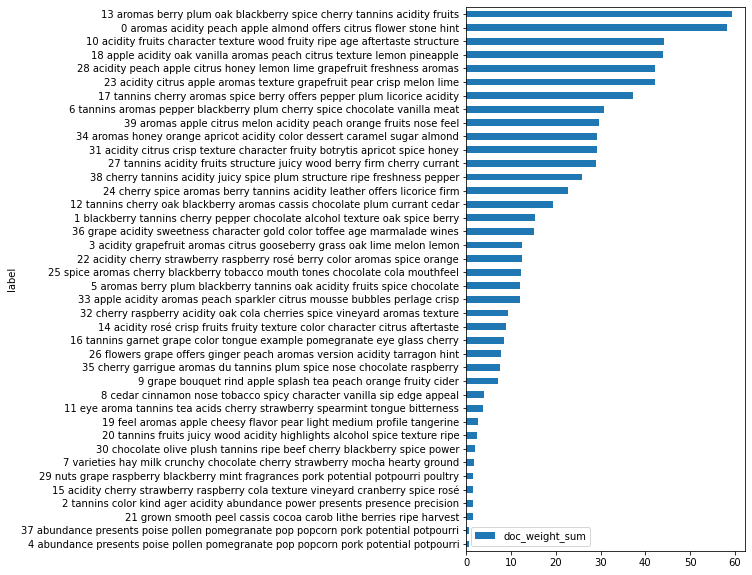

In [96]:
#add lable column to topics - concatenates all the terms in the topic
TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x), 1)

#add the doc weight score
TOPICS['doc_weight_sum'] = THETA.sum()

#plot the doc weight for each topic
TOPICS.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10)) 

In [98]:
#Create Varieties table - group doc term matrix by variety and transpose
topic_cols = [t for t in range(n_topics)]
VERIETIES = THETA.groupby('variety')[topic_cols].mean().T                                            
VERIETIES.index.name = 'topic_id'

#add top terms to varieties table from the top terms table
VERIETIES['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)

#create a varieties table summarizing which topic is the top topic per variety
VERIETIES_table=VERIETIES.T\
                .drop('topterms')\
                .apply(pd.to_numeric)

VERIETIES_table['top_topic']=VERIETIES_table.idxmax(axis = 1)


In [99]:
VERIETIES_table

topic_id,0,1,2,3,4,5,6,7,8,9,...,31,32,33,34,35,36,37,38,39,top_topic
variety,,,,,,,,,,,,,,,,,,,,,
Abouriou,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.037970,0.000962,0.000962,...,0.000962,0.000962,0.000962,0.000962,0.000962,0.187087,0.000962,0.250199,0.000962,10
Agiorgitiko,0.000043,0.000043,0.000043,0.000043,0.000043,0.000043,0.532506,0.000043,0.148880,0.000043,...,0.000043,0.000043,0.000043,0.000043,0.000043,0.000043,0.000043,0.093607,0.000043,6
Aglianico,0.000745,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,...,0.000006,0.000006,0.004965,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,17
Aidani,0.756250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,...,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0.006250,0
Airen,0.238181,0.001087,0.001087,0.001087,0.001087,0.001087,0.001087,0.001087,0.001087,0.001087,...,0.001087,0.001087,0.001087,0.001087,0.001087,0.132545,0.001087,0.001087,0.589057,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zinfandel,0.000001,0.980017,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,0.000001,...,0.000001,0.003736,0.000001,0.000001,0.000001,0.000200,0.000001,0.000001,0.000001,1
Zlahtina,0.001250,0.001250,0.001250,0.001250,0.001250,0.001250,0.001250,0.001250,0.001250,0.001250,...,0.001250,0.001250,0.001250,0.001250,0.001250,0.082215,0.001250,0.001250,0.001250,18
Zweigelt,0.000016,0.000016,0.000016,0.000016,0.000016,0.000016,0.000016,0.000016,0.000016,0.000016,...,0.024026,0.000016,0.000016,0.000016,0.000016,0.000016,0.000016,0.913706,0.000016,38


In [100]:
tops=VERIETIES['topterms']

#add the corresponding top term to the table
VERIETIES_table=VERIETIES_table.reset_index().merge(tops,how='left',left_on="top_topic",right_on="topic_id").set_index('variety')



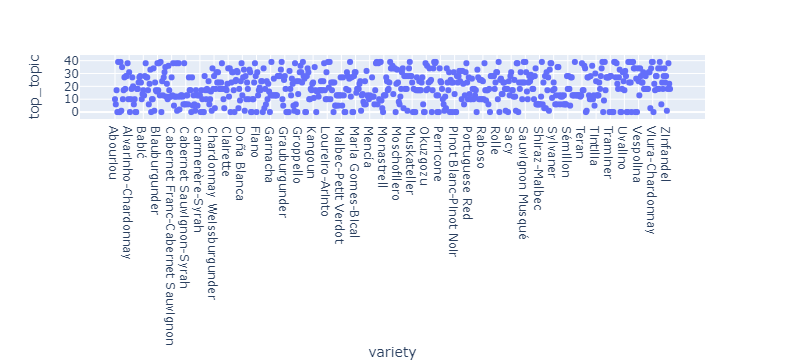

In [101]:
px.scatter(VERIETIES_table.reset_index(), x='variety', y='top_topic', hover_name='topterms')

In [102]:
#move top topic and topic topic terms to front of dataframe
tpk = VERIETIES_table['top_topic']
VERIETIES_table.drop(labels=['top_topic'], axis=1,inplace = True)
VERIETIES_table.insert(0, 'top_topic', tpk)
trm=VERIETIES_table['topterms']
VERIETIES_table.drop(labels=['topterms'], axis=1,inplace = True)
VERIETIES_table.insert(1, 'top_topicterms', trm)
VERIETIES_table.head(2)

,top_topic,top_topicterms,0,1,2,3,4,5,6,7,...,30,31,32,33,34,35,36,37,38,39
variety,,,,,,,,,,,,,,,,,,,,,
Abouriou,10,acidity fruits character texture wood fruity r...,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.037970,...,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.187087,0.000962,0.250199,0.000962
Agiorgitiko,6,tannins aromas pepper blackberry plum cherry s...,0.000043,0.000043,0.000043,0.000043,0.000043,0.000043,0.532506,0.000043,...,0.000043,0.000043,0.000043,0.000043,0.000043,0.000043,0.000043,0.000043,0.093607,0.000043


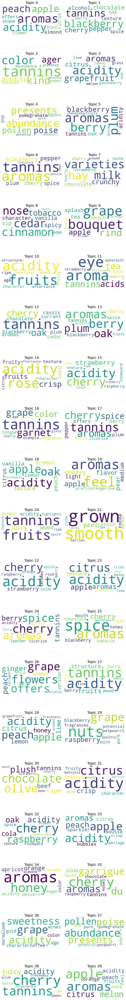

In [103]:
# Plot a word cloud for each of the 40 topics
fig, axs = plt.subplots(20,2, figsize=(10,80), sharex=True, sharey=True)
for i in enumerate(axs.flatten()):
    fig.add_subplot(i[1])
    wordcloud = WordCloud(max_words=100, background_color="white").generate(TOPICS.label[i[0]])
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title('Topic'+" " +str(i[0]), fontsize=20)
    plt.axis("off")
plt.tight_layout()
plt.show()


# Word Embedding - Word2Vec

In [104]:
#Variety Corpus
corpus_variety = TOKEN_variety\
    .groupby('variety_id')\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [108]:
#Generate word embeddings with Gensim's library
model_variety=word2vec.Word2Vec(corpus_variety, vector_size=50, window=5, min_count=500, workers=4)

# Generate coordinates to plot
coords_variety = pd.DataFrame(index=range(len(model_variety.wv.index_to_key)))
coords_variety['label'] = [w for w in model_variety.wv.index_to_key]
coords_variety['vector'] = coords_variety['label'].apply(lambda x: model_variety.wv.get_vector(x))


In [109]:
coords_variety.head(5)

,label,vector
0,aromas,"[-1.9321649, 0.47938347, 0.12274435, -0.445024..."
1,acidity,"[-0.30644068, 1.630676, -0.10831579, 0.7212864..."
2,tannins,"[-1.199975, 1.3119992, -1.8603066, 0.84496003,..."
3,cherry,"[0.80254, -0.20412119, -2.641066, -0.38831964,..."
4,black,"[-0.97549254, 0.14224134, -4.5670223, 0.415760..."


In [110]:
# Use ScikitLearn's TSNE library
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
tsne_values_variety = tsne_model.fit_transform(coords_variety['vector'].tolist())

coords_variety['x'] = tsne_values_variety[:,0]
coords_variety['y'] = tsne_values_variety[:,1]



C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



In [111]:
coords_variety.head(5)

,label,vector,x,y
0,aromas,"[-1.9321649, 0.47938347, 0.12274435, -0.445024...",-0.960382,-20.843809
1,acidity,"[-0.30644068, 1.630676, -0.10831579, 0.7212864...",-17.321369,-1.081640
2,tannins,"[-1.199975, 1.3119992, -1.8603066, 0.84496003,...",22.508808,7.626160
3,cherry,"[0.80254, -0.20412119, -2.641066, -0.38831964,...",15.713943,-15.885043
4,black,"[-0.97549254, 0.14224134, -4.5670223, 0.415760...",20.807665,-19.077318


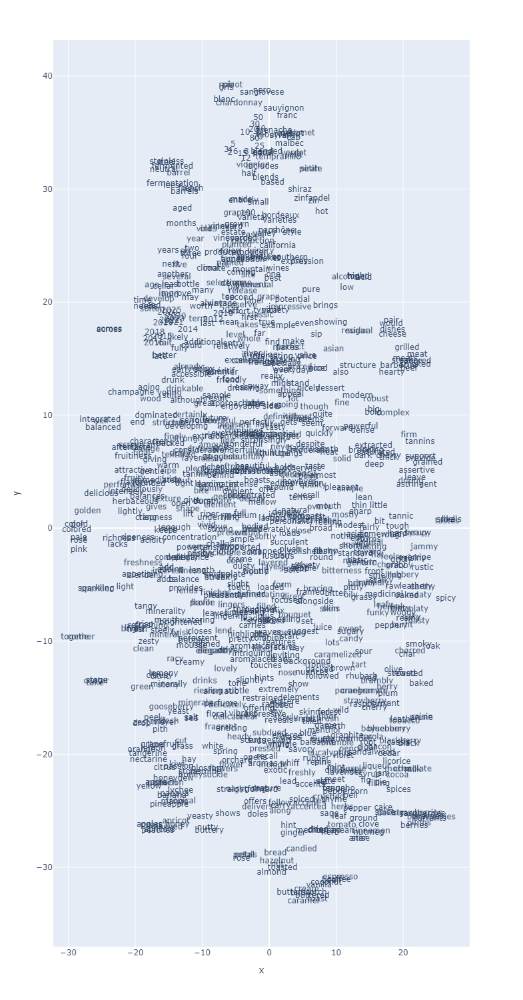

In [112]:
#Plot the coordinates
px.scatter(coords_variety, 'x', 'y', text='label', height=1500).update_traces(mode='text')

In [113]:
#merge term embeddings table with VOCAB table
coords_variety_table=coords_variety.merge(VOCAB,how="left", left_on="label", right_on="term_str").set_index("label")

In [114]:
#anology function for semantic algebra
def complete_analogy(model,A, B, C, n=2):
    try:
        return model.wv.most_similar(positive=[B, C], negative=[A])[0:n]
    except KeyError as e:
        print('Error:', e)
        return None

In [115]:
complete_analogy(model_variety,'cinnamon', 'clove', 'ginger')

[('sage', 0.7946105599403381), ('hint', 0.6511821150779724)]

In [116]:
complete_analogy(model_variety,'red', 'white', 'yellow')

[('peach', 0.7414289712905884), ('honeydew', 0.7363787889480591)]

In [117]:
complete_analogy(model_variety,'apple', 'pear', 'citrus')

[('tropical', 0.7436553835868835), ('passion', 0.7043312788009644)]

In [118]:
model_variety.wv.most_similar('cabernet')

[('cab', 0.8863457441329956),
 ('merlot', 0.8479045629501343),
 ('malbec', 0.7874046564102173),
 ('syrah', 0.6959808468818665),
 ('verdot', 0.6814254522323608),
 ('petit', 0.6663572788238525),
 ('tempranillo', 0.6359969973564148),
 ('blended', 0.6213715076446533),
 ('equal', 0.6172150373458862),
 ('25', 0.6166699528694153)]

In [119]:
model_variety.wv.most_similar('tempranillo')

[('malbec', 0.7785205841064453),
 ('cab', 0.7460533380508423),
 ('includes', 0.7100939750671387),
 ('syrah', 0.7080516815185547),
 ('merlot', 0.6963014006614685),
 ('25', 0.6849757432937622),
 ('20', 0.6814945936203003),
 ('blends', 0.6719073057174683),
 ('60', 0.6660051941871643),
 ('70', 0.6536047458648682)]

In [120]:
model_variety.wv.most_similar('apple')

[('pear', 0.84360271692276),
 ('peach', 0.7488700151443481),
 ('lime', 0.6983940601348877),
 ('kiwi', 0.6892245411872864),
 ('apples', 0.6872819066047668),
 ('banana', 0.6826807260513306),
 ('nectarine', 0.6796589493751526),
 ('flesh', 0.6724646091461182),
 ('melon', 0.6594834327697754),
 ('citrus', 0.6550458073616028)]

In [121]:
model_variety.wv.most_similar('pinot')

[('noir', 0.6911757588386536),
 ('gris', 0.6907778382301331),
 ('chardonnay', 0.6826865673065186),
 ('sparkling', 0.5205144882202148),
 ('champagne', 0.49775347113609314),
 ('sparkler', 0.47587451338768005),
 ('delicately', 0.45852094888687134),
 ('rosé', 0.44540002942085266),
 ('nero', 0.44441965222358704),
 ('pale', 0.4405212104320526)]

In [122]:
model_variety.wv.most_similar('meat')

[('cured', 0.8368668556213379),
 ('meats', 0.8340054750442505),
 ('smoked', 0.8235377073287964),
 ('beef', 0.7995420098304749),
 ('sauce', 0.797090470790863),
 ('steak', 0.7733321189880371),
 ('grilled', 0.7360841631889343),
 ('bacon', 0.7334254384040833),
 ('mushroom', 0.7083884477615356),
 ('barbecue', 0.6849631667137146)]

In [123]:
model_variety.wv.most_similar('leaf')

[('tomato', 0.8342310786247253),
 ('oregano', 0.8137964010238647),
 ('dill', 0.7990157604217529),
 ('herbs', 0.7063077688217163),
 ('chopped', 0.7040181159973145),
 ('thyme', 0.6958307027816772),
 ('fennel', 0.6863691210746765),
 ('mint', 0.6823976635932922),
 ('herb', 0.6782522201538086),
 ('eucalyptus', 0.6489320993423462)]

In [124]:
model_variety.wv.most_similar('wait')

[('2015', 0.8790450096130371),
 ('2016', 0.8737389445304871),
 ('2017', 0.8723134398460388),
 ('2014', 0.8663946986198425),
 ('better', 0.8327890038490295),
 ('improve', 0.8223618865013123),
 ('likely', 0.8222565650939941),
 ('soften', 0.8218899965286255),
 ('2018', 0.8086488246917725),
 ('late', 0.8034620881080627)]

# Sentiment Analysis

In [126]:
# use VADER sentiment analyzer
analyser = SentimentIntensityAnalyzer()

vader_cols = PARAS.para_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
PARA_vader=vader_cols
#add variety names from variety table into vader sentiment table
PARA_vader=PARA_vader.reset_index().merge(DIC_V_DF.reset_index(),how='left',on='variety_id').set_index('variety_id')

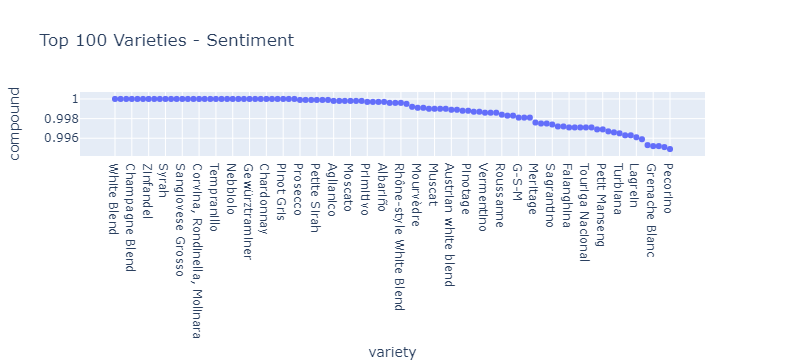

In [127]:
#plot top 100 varieties by sentiment compound value
c=PARA_vader.sort_values(['compound'],ascending=False).head(100)
px.scatter(c, x='variety', y='compound', 
           log_x=False, log_y=False, title="Top 100 Varieties - Sentiment")

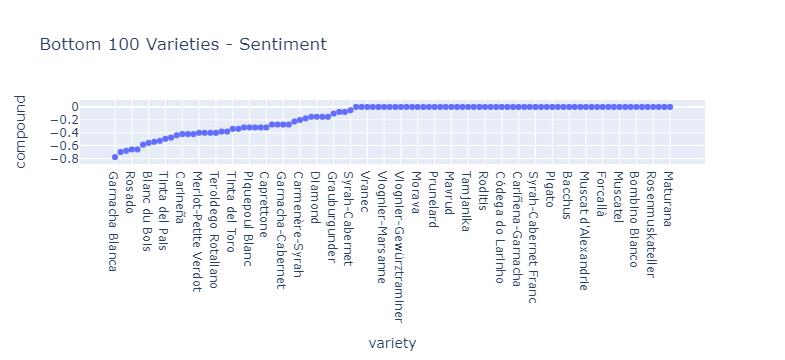

In [128]:
#plot bottom  100 varieties by sentiment compound value
d=PARA_vader.sort_values(['compound'],ascending=True).head(100)
px.scatter(d, x='variety', y='compound', 
           log_x=False, log_y=False,title="Bottom 100 Varieties - Sentiment")